In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

C:\JuniorISEP\PoC\PoC\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Data Visualisation

## Loading Dataset

In [3]:
file_path = 'bee_features.csv'
df = pd.read_csv('bee_features.csv')

print("Dataset loaded successfully. Shape:", df.shape)
print("\nFirst 5 rows of the dataset:")
print(df.head())
print("\nDataset Info:")
df.info()

Dataset loaded successfully. Shape: (249, 25)

First 5 rows of the dataset:
   ID  R_min  R_max      R_mean  R_median      R_std  G_min  G_max  \
0   1      5    208   68.085745      56.0  47.955399      3    199   
1   2      2    248   63.786498      55.0  42.153508      2    251   
2   3      3    255  107.176333     114.0  58.771359      0    255   
3   4      5    219   87.588243      88.0  46.322587      3    213   
4   5      6    255  123.177003     134.0  62.355944      0    250   

       G_mean  G_median  ...      B_std  pixel_ratio    area  perimeter  \
0   54.882747      37.0  ...  36.250747     0.007428  178273       8998   
1   52.079650      34.0  ...  34.617117     0.008553  205272       9494   
2   87.794710      86.0  ...  54.823596     0.022093  530235      11818   
3   71.031852      61.0  ...  37.445621     0.013187  316497      12385   
4  100.897964      91.0  ...  60.624962     0.009165  219951       7870   

   circularity_laplacian  bounding_box_ratio  center

## Repartitions of Bug Types and Species

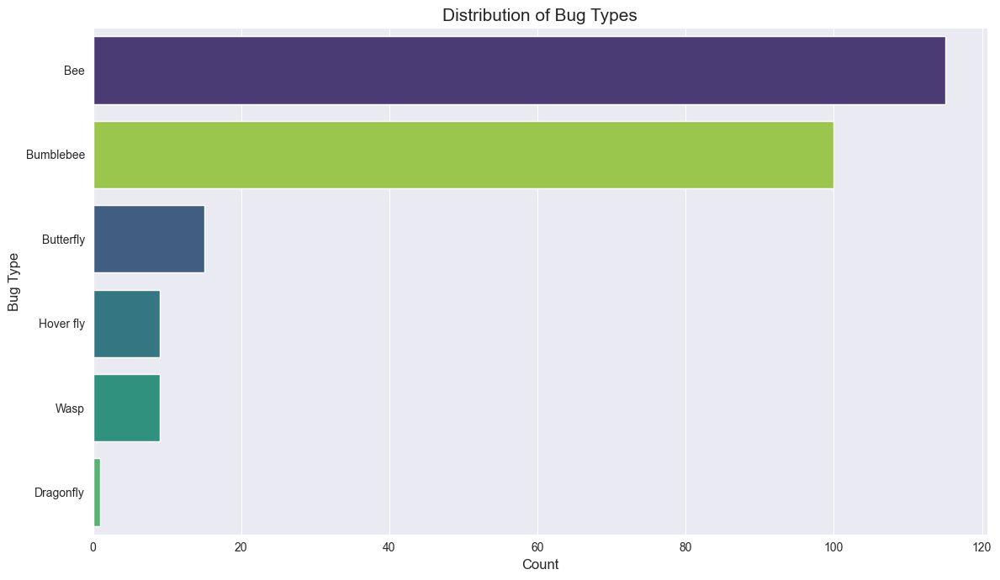

In [5]:
plt.figure(figsize=(12, 7))
sns.countplot(data=df, y='bug type', hue='bug type', order=df['bug type'].value_counts().index, palette='viridis', dodge=False, legend=False)
plt.title('Distribution of Bug Types', fontsize=15)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Bug Type', fontsize=12)
plt.tight_layout()
plt.show()

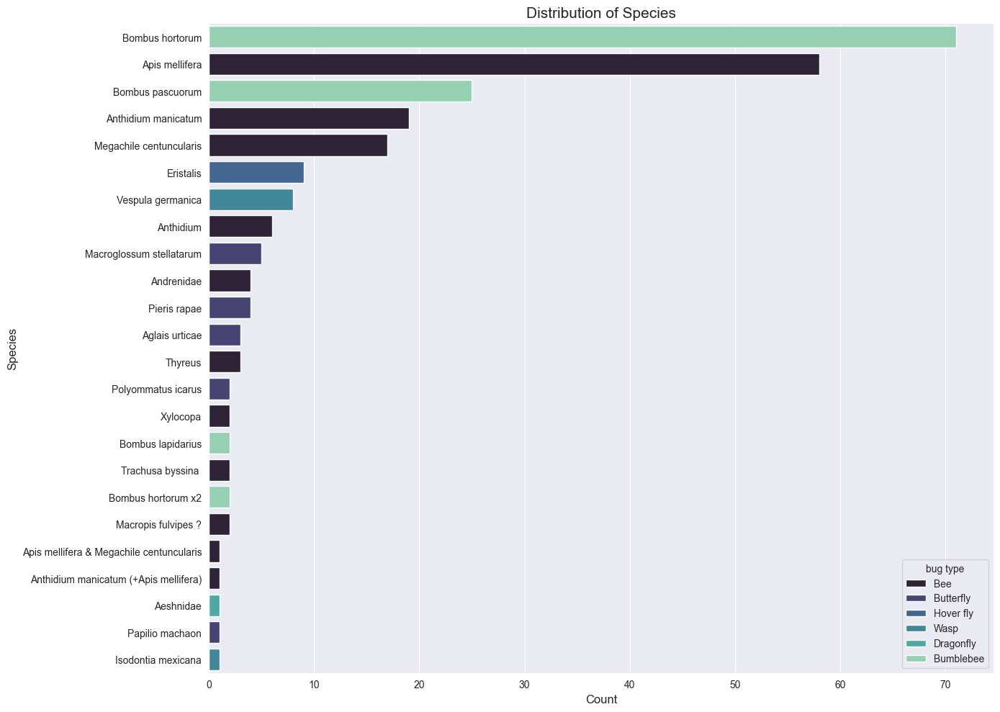


Value counts for 'species':
species
Bombus hortorum                             71
Apis mellifera                              58
Bombus pascuorum                            25
Anthidium manicatum                         19
Megachile centuncularis                     17
Eristalis                                    9
Vespula germanica                            8
Anthidium                                    6
Macroglossum stellatarum                     5
Andrenidae                                   4
Pieris rapae                                 4
Aglais urticae                               3
Thyreus                                      3
Polyommatus icarus                           2
Xylocopa                                     2
Bombus lapidarius                            2
Trachusa byssina                             2
Bombus hortorum x2                           2
Macropis fulvipes ?                          2
Apis mellifera & Megachile centuncularis     1
Anthidium manicatum (+A

In [7]:
plt.figure(figsize=(14, 10))
sns.countplot(data=df, y='species', hue='bug type', order=df['species'].value_counts().index, palette='mako')
plt.title('Distribution of Species', fontsize=15)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Species', fontsize=12)
plt.tight_layout()
plt.show()
print("\nValue counts for 'species':")
print(df['species'].value_counts())

## Distribution of species within each bug type

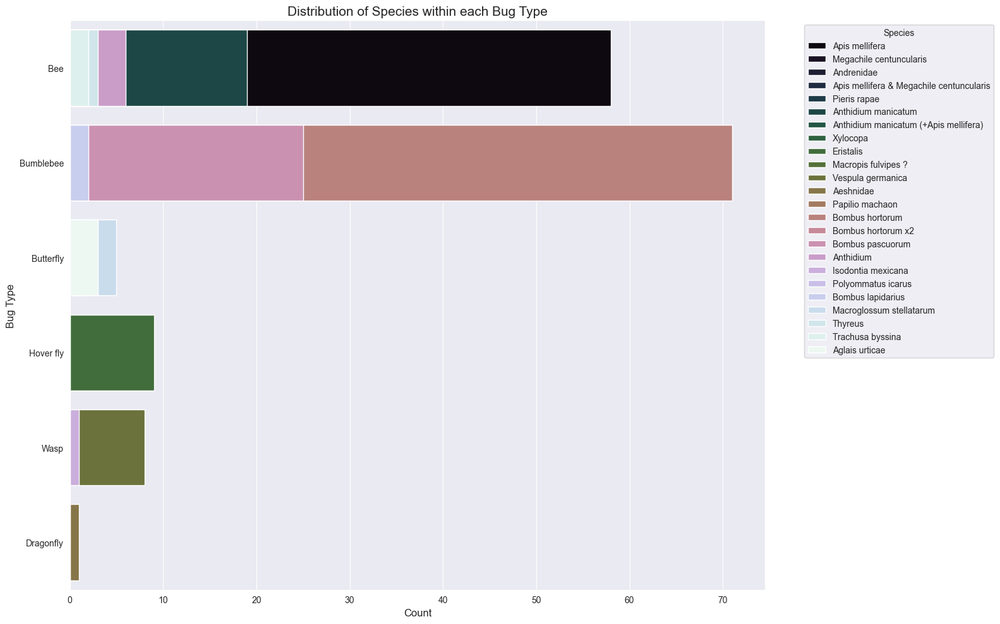

In [8]:
plt.figure(figsize=(16, 10))
sns.countplot(data=df, y='bug type', hue='species', order=df['bug type'].value_counts().index, dodge=False, palette='cubehelix')
plt.title('Distribution of Species within each Bug Type', fontsize=15)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Bug Type', fontsize=12)
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

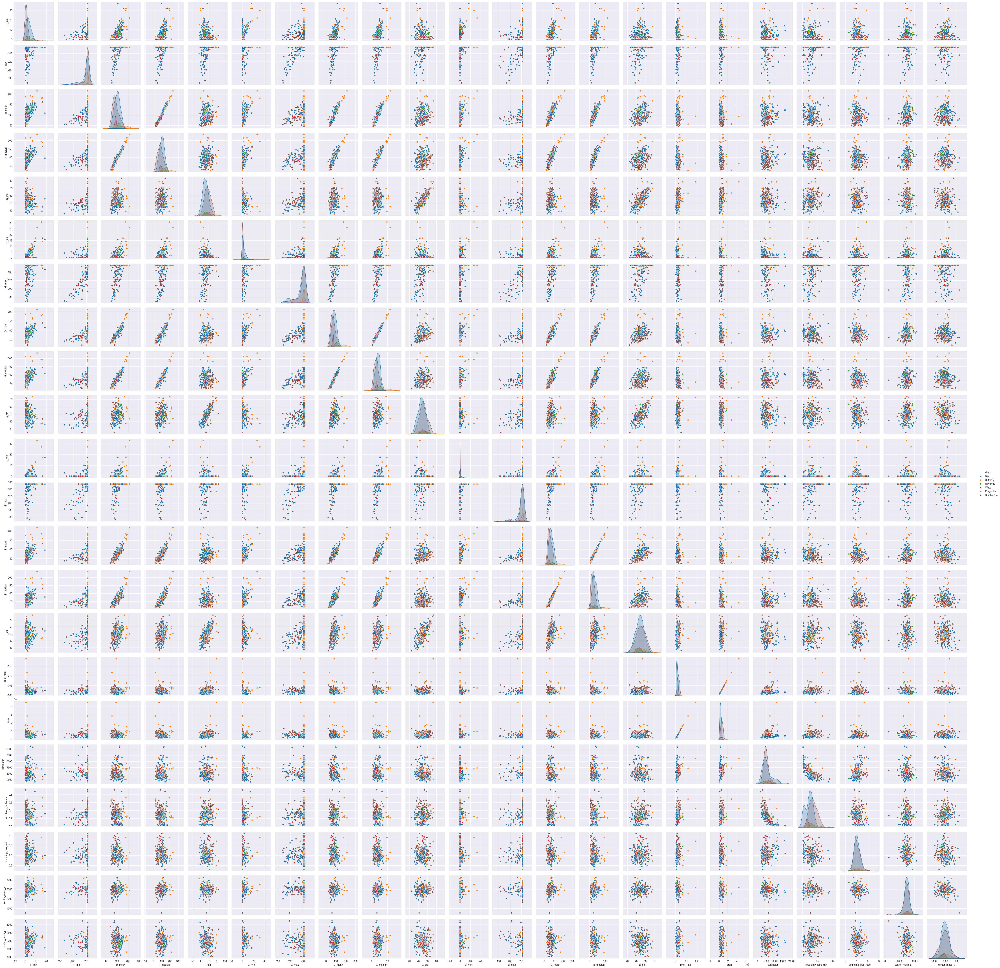

In [26]:
features = df.drop(columns=['ID', 'bug type', 'species'])  # Adjust columns as needed
features['class'] = df['bug type']

# Create the pairplot
sns.pairplot(features, hue='class', palette='tab10')
plt.show()

## PCA


Shape of feature matrix X_scaled: (249, 22)


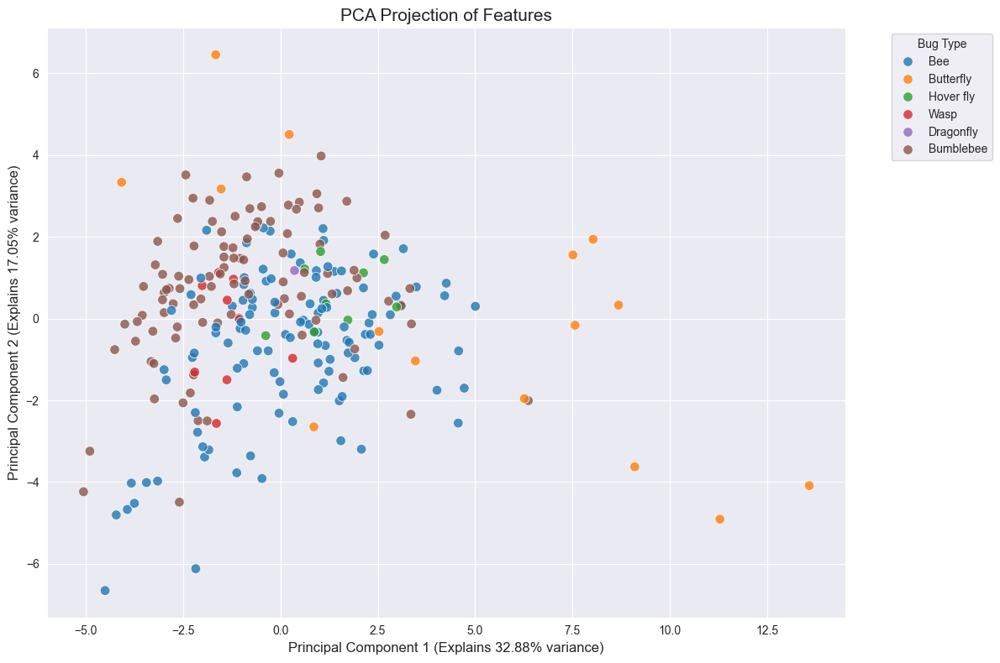

In [20]:
features = df.columns.drop(['ID', 'bug type', 'species'])
X = df[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print(f"\nShape of feature matrix X_scaled: {X_scaled.shape}")


pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(data=X_pca, columns=['PCA1', 'PCA2'])
pca_df['bug type'] = df['bug type']

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='bug type', data=pca_df, palette='tab10', s=70, alpha=0.8)
plt.title('PCA Projection of Features', fontsize=15)
plt.xlabel(f'Principal Component 1 (Explains {pca.explained_variance_ratio_[0]*100:.2f}% variance)', fontsize=12)
plt.ylabel(f'Principal Component 2 (Explains {pca.explained_variance_ratio_[1]*100:.2f}% variance)', fontsize=12)
plt.legend(title='Bug Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

Nothing much to see here. The data is quite mangled up so PCA is not the best methode in this case.

In [12]:
print(f"Total explained variance by 2 PCA components: {sum(pca.explained_variance_ratio_)*100:.2f}%")

Total explained variance by 2 PCA components: 49.93%


## Non-linear projections:

### t-SNE

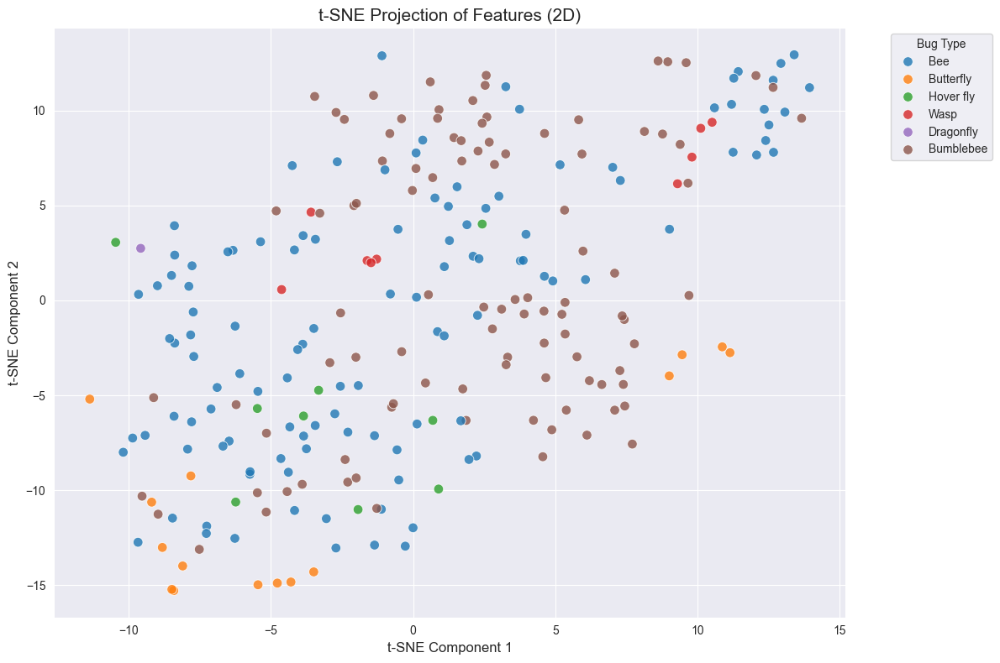

t-SNE finished.


In [19]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000, learning_rate='auto', init='pca')
X_tsne = tsne.fit_transform(X_scaled)

tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2'])
tsne_df['bug type'] = df['bug type']

plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='bug type', data=tsne_df, palette='tab10', s=70, alpha=0.8)
plt.title('t-SNE Projection of Features', fontsize=15)
plt.xlabel('t-SNE Component 1', fontsize=12)
plt.ylabel('t-SNE Component 2', fontsize=12)
plt.legend(title='Bug Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()
print("t-SNE finished.")

### UMAP

C:\JuniorISEP\PoC\PoC\.venv\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\JuniorISEP\PoC\PoC\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


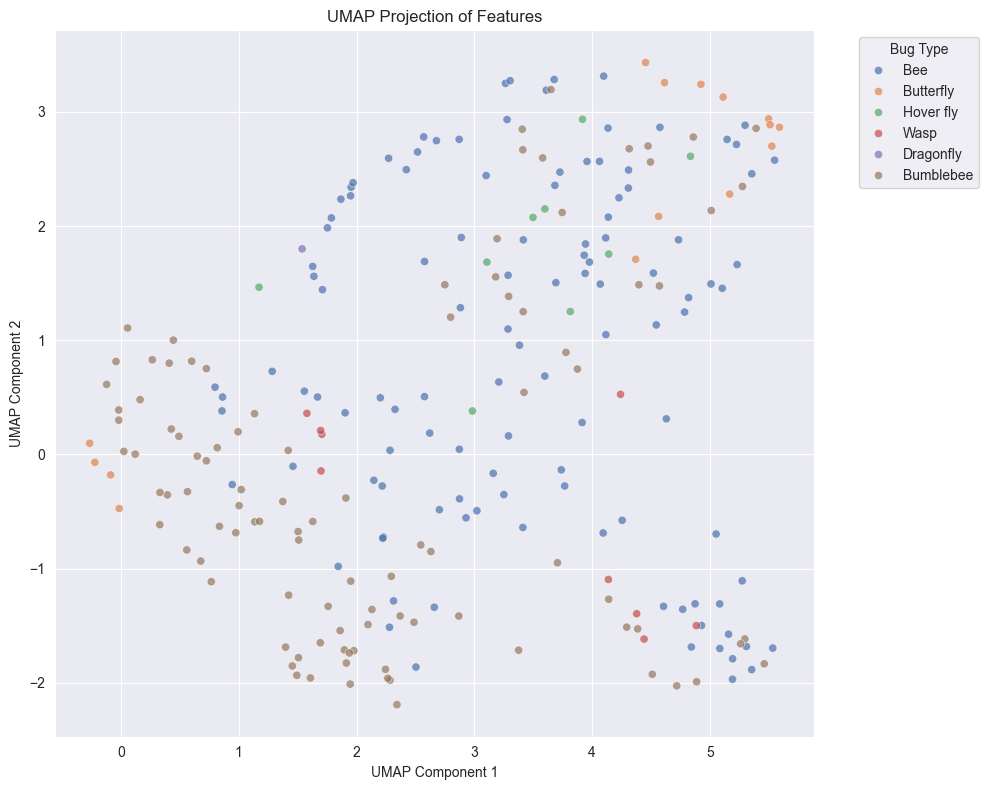

In [23]:
reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
X_umap = reducer.fit_transform(X_scaled)

umap_df = pd.DataFrame(data=X_umap, columns=['UMAP1', 'UMAP2'])
umap_df['bug type'] = df['bug type']

plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='bug type', data=umap_df, palette='deep', alpha=0.7)
plt.title('UMAP Projection of Features')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.legend(title='Bug Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()
